In [1]:
import os
import pandas as pd
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy.io import wavfile

import re
import IPython.display as ipd
%matplotlib inline


In [2]:
train_path = './train/audio/'

classes = ['yes','no', 'up', 'down', 'left', 'right', 'on', 'off', 'stop', 'go']

def padding(spectrogram):
    return np.hstack([spectrogram[:, 0].reshape(-1, 1), spectrogram])

def log_mel_spectrogram(sample, sample_rate):
    return librosa.logamplitude(librosa.feature.melspectrogram(sample, sample_rate, n_mels = 128)).round()

def load_audio_file(file_path):
    data = librosa.core.load(file_path, sr=16000)[0] #, sr=16000
    return data

In [20]:
labels = []
train_data=[]
samples_ = []
samples_dif = []

file_names = []
file_path = []

# '클래스이름 'stop에서 바꾸면됨
class_name = 'up'
for idx, file in enumerate(os.listdir(train_path + class_name + '/')):
    sample_rate, sample = wavfile.read(train_path + class_name + '/' + file)
    spectrogram = log_mel_spectrogram(sample, sample_rate)
    samples_.append(sample)
    sample = sample.astype('float32')
    max_min = max(sample) - min(sample)
    samples_dif.append(max_min)
    while spectrogram.shape[1] < 32:
        spectrogram = padding(spectrogram)
    file_names.append(file)
    
    file_path.append(train_path + class_name + '/' + file)        
    train_data.append(spectrogram)  
    #labels.append(class_name)
    
size = len(train_data)



print(len(train_data))

2375


In [ ]:
2375, 2359

In [12]:
- 132, 164, 260, 263, 342, 473, 580, 589, 590, 591, 598, 648, 649, 650, 651, 652, 740, 765, 1315, 1679, 1681, 1930, 1931
- 1932, 1933, 1934, 2140, 2179, 2180, 2248, 2331, 2355, 2356, 2357, 2358

593.75


In [142]:
ipd.Audio(file_path[2339], rate=16000)

In [4]:
down_drop = []
down_drop = '43', '476', '527', '576', '577', '622','656','1068','1527','1648','1649','1650','1651','1652','1722','1872','1907','1908','1909','1910','1911','2153','2154','2155','2336','2338','2339'
len(down_drop)

27

In [5]:
up_drop = []
up_drop = '132', '164', '260', '263', '342', '473', '580', '589', '590', '591', '598', '648', '649', '650', '651', '652', '740', '765', '1315', '1679', '1681', '1930', '1931', '1932', '1933', '1934', '2140', '2179', '2180', '2248', '2331', '2355', '2356', '2357', '2358'
len(up_drop)

35

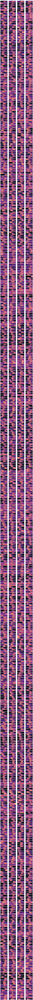

In [93]:
fig = plt.figure(figsize=(16, 500))
for i, j in enumerate(train_data):
    if i < 2356:
        ax = fig.add_subplot(size/4, 4, i+1)
        librosa.display.specshow(j)
        plt.title(str(i)+'('+ str(samples_dif[i]) +')')
    else:
        break

## 파일 제거

In [21]:
up_drop = list(map(int, up_drop))
up_file_path_names = []

for i in up_drop:
    up_file_path_names.append(file_path[i])

In [16]:
down_drop = list(map(int, down_drop))
down_file_path_names = []

for i in down_drop:
    down_file_path_names.append(file_path[i])

In [22]:
up_file_path_names

['./train/audio/up/122c5aa7_nohash_4.wav',
 './train/audio/up/15c563d7_nohash_4.wav',
 './train/audio/up/1eddce1d_nohash_0.wav',
 './train/audio/up/1eddce1d_nohash_3.wav',
 './train/audio/up/28ce0c58_nohash_2.wav',
 './train/audio/up/36050ef3_nohash_3.wav',
 './train/audio/up/3ea77ede_nohash_1.wav',
 './train/audio/up/3f2b358d_nohash_0.wav',
 './train/audio/up/3f2b358d_nohash_1.wav',
 './train/audio/up/3f2b358d_nohash_2.wav',
 './train/audio/up/40115b19_nohash_2.wav',
 './train/audio/up/46a153d8_nohash_0.wav',
 './train/audio/up/46a153d8_nohash_1.wav',
 './train/audio/up/46a153d8_nohash_2.wav',
 './train/audio/up/46a153d8_nohash_3.wav',
 './train/audio/up/46a153d8_nohash_4.wav',
 './train/audio/up/51055bda_nohash_3.wav',
 './train/audio/up/533c6564_nohash_0.wav',
 './train/audio/up/92a9c5e6_nohash_3.wav',
 './train/audio/up/b9f46737_nohash_3.wav',
 './train/audio/up/b9f46737_nohash_5.wav',
 './train/audio/up/ced835d3_nohash_0.wav',
 './train/audio/up/ced835d3_nohash_1.wav',
 './train/a

In [18]:
up_file_path_names

['./train/audio/down/130d9a87_nohash_0.wav',
 './train/audio/down/1746d7b6_nohash_0.wav',
 './train/audio/down/210f3aa9_nohash_0.wav',
 './train/audio/down/2151b09a_nohash_1.wav',
 './train/audio/down/28e47b1a_nohash_4.wav',
 './train/audio/down/37d38e44_nohash_0.wav',
 './train/audio/down/40b60ae9_nohash_0.wav',
 './train/audio/down/422d3197_nohash_0.wav',
 './train/audio/down/4249c833_nohash_0.wav',
 './train/audio/down/4254621e_nohash_0.wav',
 './train/audio/down/437455be_nohash_1.wav',
 './train/audio/down/49af4432_nohash_3.wav',
 './train/audio/down/49af4432_nohash_4.wav',
 './train/audio/down/49f30eed_nohash_0.wav',
 './train/audio/down/4a0e2c16_nohash_0.wav',
 './train/audio/down/4a1e736b_nohash_0.wav',
 './train/audio/down/563aa4e6_nohash_2.wav',
 './train/audio/down/590750e8_nohash_1.wav',
 './train/audio/down/96c66ab7_nohash_1.wav',
 './train/audio/down/bbd0bbd0_nohash_4.wav',
 './train/audio/down/bc196f81_nohash_0.wav',
 './train/audio/down/d197e3ae_nohash_1.wav',
 './train/

In [13]:
for i in up_file_path_names:
    os.remove(i)
for i in down_file_path_names:
    os.remove(i)